Emily Nadelmann, Eric Lindberg <br>
eric.lindberg@mdc-berlin.de

# Packages

In [1]:
import os
import anndata
import logging
import numpy as np
import pandas as pd
from datetime import timedelta, datetime
import scanpy as sc
import seaborn as sns
import matplotlib.pyplot as plt
import leidenalg
import csv
from pandas import Timestamp
import re
import matplotlib.pyplot as plt
from scipy.stats import rankdata 
import scipy
import harmonypy as hm
import random
from scipy.stats.stats import pearsonr   
import scipy.sparse
#from SCCAF import *

In [ ]:
sc.settings.verbosity =3
sc.logging.print_version_and_date()
sc.settings.set_figure_params(dpi=300, color_map='RdBu_r')
sc.settings.figdir = "/fast/AG_Huebner/huebner3/ANALYSES/20190926_gp_BadOyenhausen/scanpy/scripts/Manuscript/figures/"

In [3]:
random_state=10

# Load preprocessed neuronal object

Load the object from the first iteration

In [46]:
x=sc.read_h5ad("/fast/AG_Huebner/huebner3/ANALYSES/20190926_gp_BadOyenhausen/scanpy/20210302/Objects_cellxgene/Cellxgene_FTP/NC_DCM_annotated_10062021_character.h5ad")

/fast/AG_Huebner/GUIX_PROFILES/conda_envs/scanpy_151/lib/python3.8/site-packages/anndata/compat/__init__.py:158: FutureWarning: Moving element from .uns['neighbors']['distances'] to .obsp['distances'].

This is where adjacency matrices should go now.
  warn(


In [47]:
x.shape

(10098, 33538)

In [13]:
NEURONAL_RAW=sc.read_h5ad("/fast/AG_Huebner/huebner3/ANALYSES/20190926_gp_BadOyenhausen/scanpy/20210302/Subclusters/N_20210305_V1_RAW.h5ad")

... storing 'Patient' as categorical
... storing 'Sample' as categorical
... storing 'Diagnosis' as categorical
... storing 'Clinical.dominant.mutation' as categorical
... storing 'Region' as categorical
... storing 'X10X_version' as categorical
... storing 'NC_DCM_annotated_10062021' as categorical


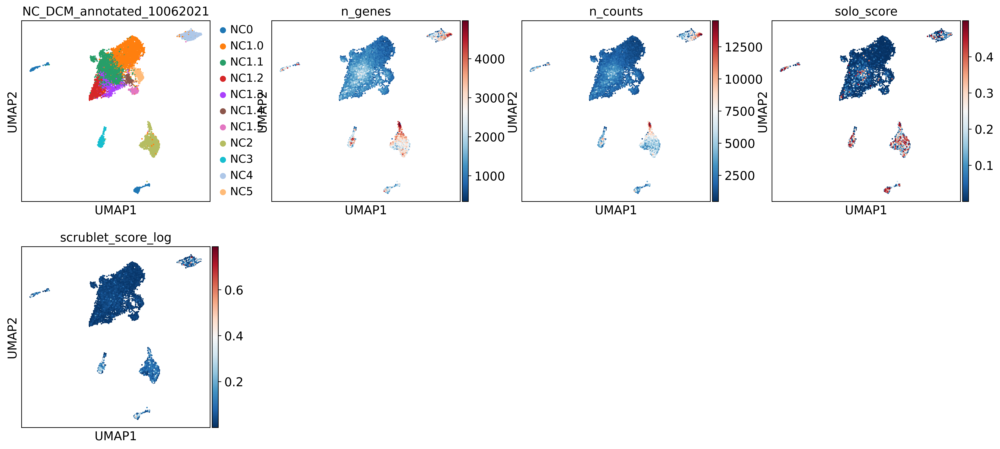

In [14]:
sc.pl.umap(x, 
          color=['NC_DCM_annotated_10062021', 'n_genes', 'n_counts', 'solo_score', 'scrublet_score_log'])

In [15]:
x.raw.X[1:10000,1:10000].todense() # Most likely lib size normalized and logged counts?

matrix([[0.        , 0.        , 0.        , ..., 0.        , 0.        ,
         0.        ],
        [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
         0.        ],
        [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
         0.        ],
        ...,
        [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
         0.        ],
        [0.        , 0.        , 0.        , ..., 0.        , 1.42277445,
         0.        ],
        [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
         0.        ]])

In [16]:
if all(NEURONAL_RAW.obs.index==x.obs.index):
    print("OK")
    NEURONAL_RAW.obs=x.obs

OK


# Remove chimeric states

In [17]:
NEURONAL_RAW_NODOUBLETS=NEURONAL_RAW[~NEURONAL_RAW.obs.NC_DCM_annotated_10062021.isin(['NC0', 'NC2', 'NC3'])].copy()

In [18]:
sc.pp.normalize_per_cell(NEURONAL_RAW_NODOUBLETS, counts_per_cell_after=1e4)
sc.pp.log1p(NEURONAL_RAW_NODOUBLETS)
NEURONAL_RAW_NODOUBLETS.raw=NEURONAL_RAW_NODOUBLETS

normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)


extracting highly variable genes
    finished (0:00:01)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


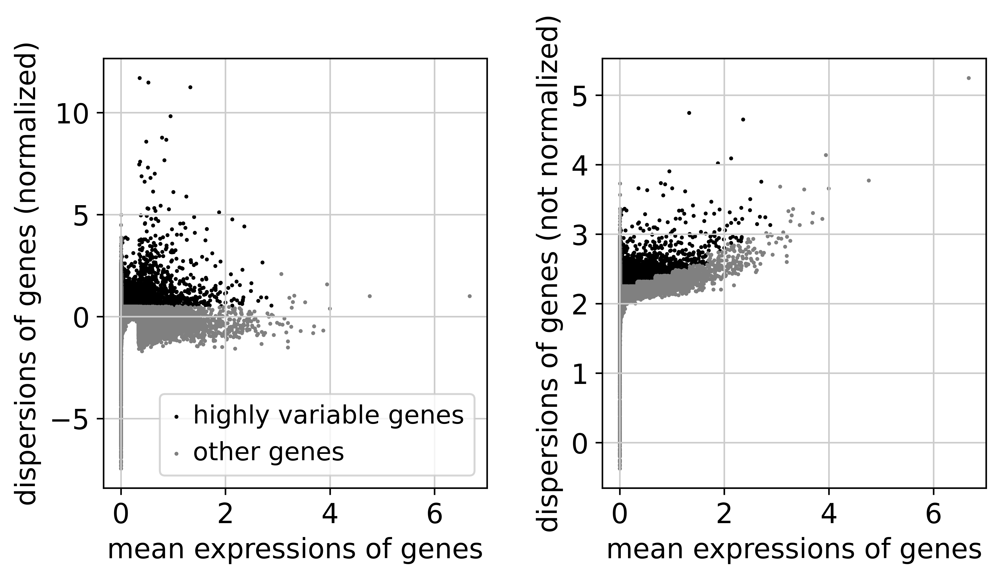

regressing out ['n_counts', 'percent_mito']
    sparse input is densified and may lead to high memory use
    finished (0:00:36)


(7999, 3911)

In [19]:
sc.pp.highly_variable_genes(NEURONAL_RAW_NODOUBLETS)
sc.pl.highly_variable_genes(NEURONAL_RAW_NODOUBLETS)
NEURONAL_RAW_NODOUBLETS_hvg = NEURONAL_RAW_NODOUBLETS[:, NEURONAL_RAW_NODOUBLETS.var['highly_variable']]
sc.pp.regress_out(NEURONAL_RAW_NODOUBLETS_hvg, ['n_counts', 'percent_mito'])
sc.pp.scale(NEURONAL_RAW_NODOUBLETS_hvg, max_value = 10)
NEURONAL_RAW_NODOUBLETS_hvg.shape

In [20]:
sc.tl.pca(NEURONAL_RAW_NODOUBLETS_hvg, svd_solver = 'arpack', random_state = random_state)

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:06)


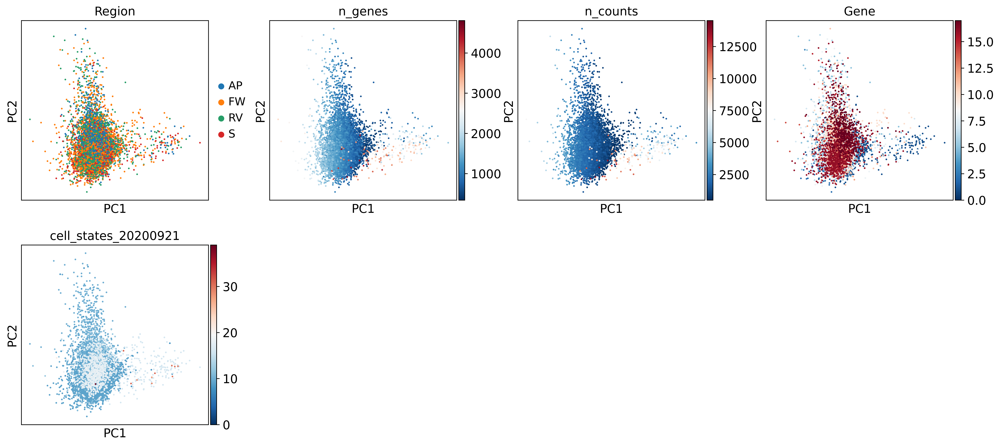

In [21]:
sc.pl.pca(NEURONAL_RAW_NODOUBLETS_hvg, color = ['Region', 'n_genes', 'n_counts', 'Gene', 'cell_states_20200921'])

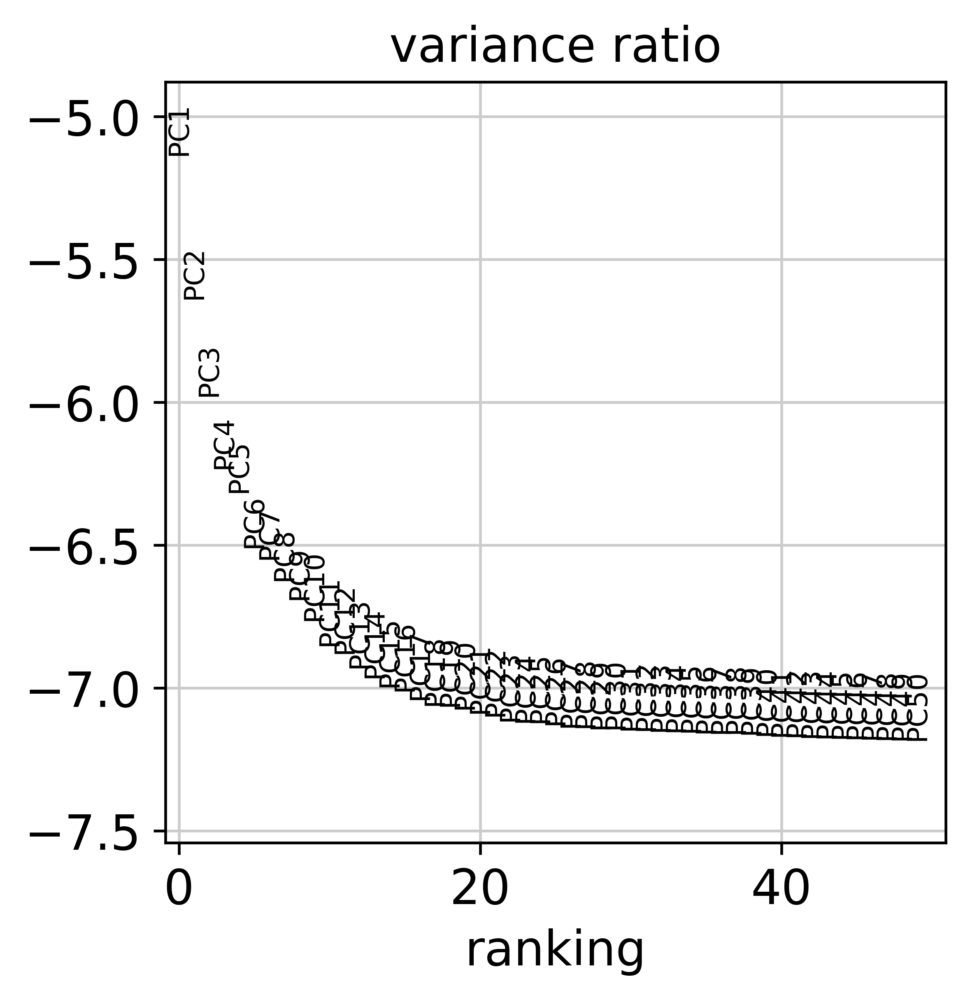

In [22]:
sc.pl.pca_variance_ratio(NEURONAL_RAW_NODOUBLETS_hvg, log=True, n_pcs=50)

In [23]:
num_pcs= 12 # 22 # 10 nice, but NC1.4 and NC1.3 was not that clear
pca = NEURONAL_RAW_NODOUBLETS_hvg.obsm['X_pca']
meta_data = NEURONAL_RAW_NODOUBLETS_hvg.obs
NEURONAL_RAW_NODOUBLETS_harmony=NEURONAL_RAW_NODOUBLETS_hvg.copy()

In [24]:
ho = hm.run_harmony(pca, meta_data, ['Patient'], 
                    epsilon_harmony = -float('Inf'), epsilon_cluster = -float('Inf'), 
                    random_state=random_state)

2021-10-21 15:50:05,527 - harmonypy - INFO - Iteration 1 of 10
2021-10-21 15:50:08,778 - harmonypy - INFO - Iteration 2 of 10
2021-10-21 15:50:12,013 - harmonypy - INFO - Iteration 3 of 10
2021-10-21 15:50:15,247 - harmonypy - INFO - Iteration 4 of 10
2021-10-21 15:50:18,464 - harmonypy - INFO - Iteration 5 of 10
2021-10-21 15:50:21,687 - harmonypy - INFO - Iteration 6 of 10
2021-10-21 15:50:24,914 - harmonypy - INFO - Iteration 7 of 10
2021-10-21 15:50:28,142 - harmonypy - INFO - Iteration 8 of 10
2021-10-21 15:50:31,378 - harmonypy - INFO - Iteration 9 of 10
2021-10-21 15:50:34,620 - harmonypy - INFO - Iteration 10 of 10
2021-10-21 15:50:37,836 - harmonypy - INFO - Stopped before convergence


In [25]:
res = pd.DataFrame(ho.Z_corr)
res=res.T

In [26]:
NEURONAL_RAW_NODOUBLETS_harmony.obsm['X_pca'] = res.values
sc.pp.neighbors(NEURONAL_RAW_NODOUBLETS_harmony, n_pcs=num_pcs, random_state=random_state, n_neighbors= 25)

computing neighbors
    using 'X_pca' with n_pcs = 12


/fast/AG_Huebner/GUIX_PROFILES/conda_envs/scanpy_151/lib/python3.8/site-packages/numba/np/ufunc/parallel.py:355: NumbaWarning: The TBB threading layer requires TBB version 2019.5 or later i.e., TBB_INTERFACE_VERSION >= 11005. Found TBB_INTERFACE_VERSION = 6103. The TBB threading layer is disabled.
  warnings.warn(problem)


    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:04)


In [27]:
sc.tl.umap(NEURONAL_RAW_NODOUBLETS_harmony, random_state = random_state, min_dist = 0.2, spread = 1, n_components=2)

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:20)


In [28]:
sc.tl.leiden(NEURONAL_RAW_NODOUBLETS_harmony, resolution = 0.9, random_state = random_state)

running Leiden clustering
    finished: found 13 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:03)


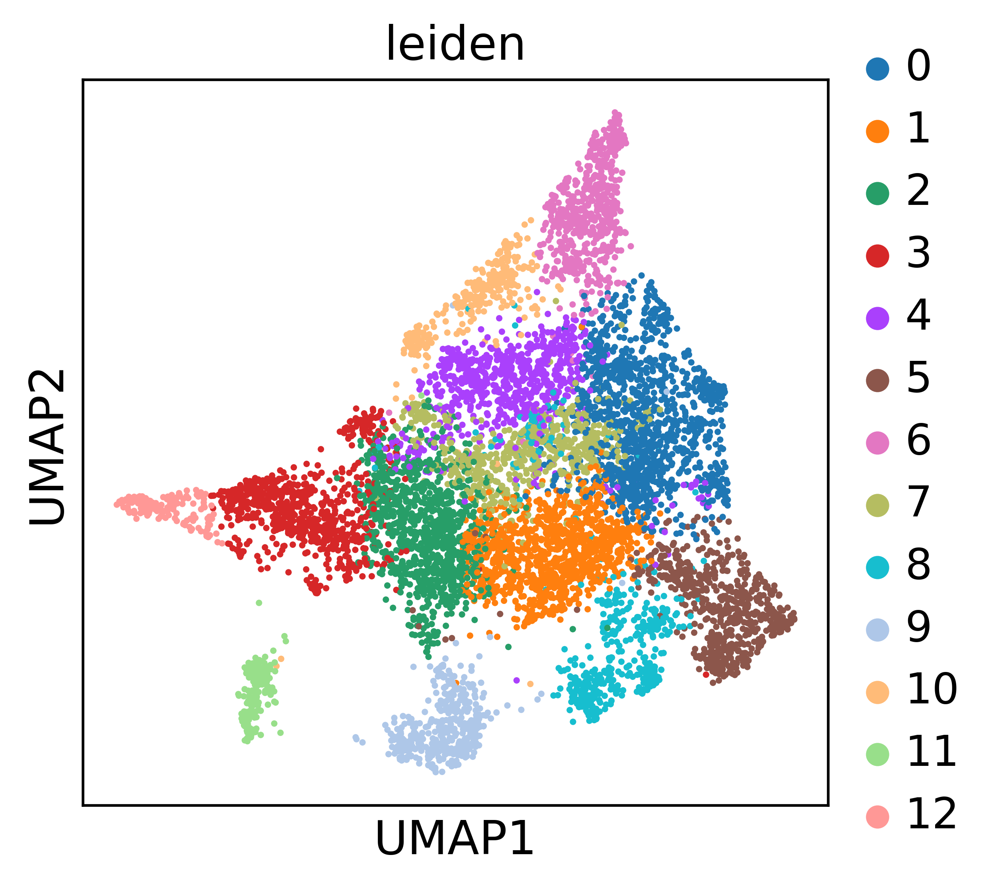

In [30]:
sc.pl.umap(NEURONAL_RAW_NODOUBLETS_harmony,
           color=['leiden'], 
           projection='2d', components=['1,2'])

In [31]:
sc.tl.rank_genes_groups(NEURONAL_RAW_NODOUBLETS_harmony, 'leiden', method='wilcoxon')
sc.pl.rank_genes_groups(NEURONAL_RAW_NODOUBLETS_harmony, n_genes=25, sharey=False)

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:13)


In [32]:
x_cntrl=NEURONAL_RAW_NODOUBLETS_harmony.copy()
subset_=sc.AnnData(x_cntrl[:,x_cntrl.var.index].raw.X, # 
                  obs=x_cntrl.obs,
                  var=x_cntrl[:,x_cntrl.var.index].raw.var
                 )

subset_.raw=subset_

x=correlation_analysis(subset_, 'leiden', sum_or_mean="mean")
x=pd.DataFrame.from_dict(x)
x['leiden']=subset_.var.index
x=x.iloc[np.where(x.mean(axis=1)>0.1)[0],:]
x=x.iloc[np.where(x.mean(axis=1)<4)[0],:]

x.corr(method='pearson').style.background_gradient(cmap='coolwarm')

,0,1,10,11,12,2,3,4,5,6,7,8,9
0,1.000000,0.977029,0.956067,0.854563,0.504172,0.971047,0.944707,0.968247,0.943183,0.930530,0.981574,0.968250,0.944295
1,0.977029,1.000000,0.933329,0.827679,0.515376,0.976363,0.938909,0.933259,0.943106,0.885607,0.977704,0.944124,0.939211
10,0.956067,0.933329,1.000000,0.895087,0.515038,0.964147,0.941813,0.960288,0.916348,0.931530,0.937227,0.954132,0.938209
11,0.854563,0.827679,0.895087,1.000000,0.518286,0.875813,0.873244,0.879543,0.814211,0.845093,0.834283,0.881806,0.878447
12,0.504172,0.515376,0.515038,0.518286,1.000000,0.553234,0.680690,0.524561,0.485071,0.507099,0.528834,0.519498,0.531664
2,0.971047,0.976363,0.964147,0.875813,0.553234,1.000000,0.969467,0.961888,0.950876,0.906695,0.966225,0.961149,0.953659
3,0.944707,0.938909,0.941813,0.873244,0.680690,0.969467,1.000000,0.947617,0.916819,0.901444,0.949816,0.943567,0.934653
4,0.968247,0.933259,0.960288,0.879543,0.524561,0.961888,0.947617,1.000000,0.920937,0.920579,0.939418,0.957660,0.941978
5,0.943183,0.943106,0.916348,0.814211,0.485071,0.950876,0.916819,0.920937,1.000000,0.849445,0.925847,0.944054,0.918955
6,0.930530,0.885607,0.931530,0.845093,0.507099,0.906695,0.901444,0.920579,0.849445,1.000000,0.913547,0.903710,0.885000


In [ ]:
# This leiden clusters are merged due to high correlation:
#
# 0+1+4+7 
# 2+3 
# 5 # This cluster is new - 
# 6 # clearly NC1.2
# 8 # although leiden 5 and leiden 8 are similar, I would annotate leiden 5 as NC1.4
# 9  # NC5
# 10 # NC1.3
# 11 # NC1.5
# 12 # clearly NC4

# Merge clusters

To be honest I wouldn't rely on SCCAF - but it can support the merging - 

In [36]:
NEURONAL_RAW_NODOUBLETS_harmony.obs['cell_states']=NEURONAL_RAW_NODOUBLETS_harmony.obs['leiden']
subs = {
    "0":"NC1.1",
    "1":"NC1.1", # 
    "2":"NC1.0",
    "3":"NC1.0",
    "4":"NC1.1", # 
    "5":"NC2",
    "6":"NC1.2",
    "7":"NC1.1",
    "8":"NC1.1",
    "9":"NC5",
    "10":"NC1.3",
    "11":"NC3",
    "12":"NC4",
     } 
# PC-like, EC-like, MP-like, MP_interacting, CM-like, ECM_r, CST3+, ECM_p, Canonical, DAAM1+
x=[subs.get(item,item)  for item in NEURONAL_RAW_NODOUBLETS_harmony.obs['cell_states']]
NEURONAL_RAW_NODOUBLETS_harmony.obs['cell_states']=x
pd.value_counts(NEURONAL_RAW_NODOUBLETS_harmony.obs['cell_states'])/NEURONAL_RAW_NODOUBLETS_harmony.shape[0]

NC1.1    0.499312
NC1.0    0.214652
NC2      0.078385
NC1.2    0.071384
NC5      0.053257
NC1.3    0.036255
NC3      0.027003
NC4      0.019752
Name: cell_states, dtype: float64

Mean CV accuracy: 0.6159
Accuracy on the training set: 1.0000
Accuracy on the hold-out set: 0.6601


<Figure size 1960x1400 with 0 Axes>

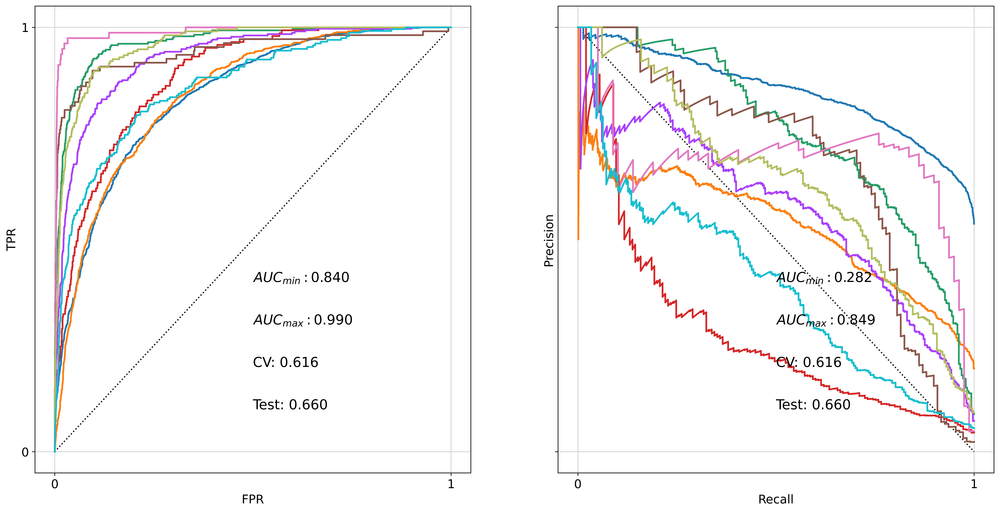

In [256]:
plt.rcParams['figure.figsize'] = [20, 10]
plt.figure(figsize=[14,10], dpi=140, facecolor='w', edgecolor='k')
y_prob, y_pred, y_test, clf, cvsm, acc = SCCAF_assessment(NEURONAL_RAW_NODOUBLETS_harmony.raw.X, 
                                                          NEURONAL_RAW_NODOUBLETS_harmony.obs['cell_states_ERIC'],n=1000)
aucs = plot_roc(y_prob, y_test, clf, cvsm=cvsm, acc=acc)
plt.show()

# Abundance boxplots

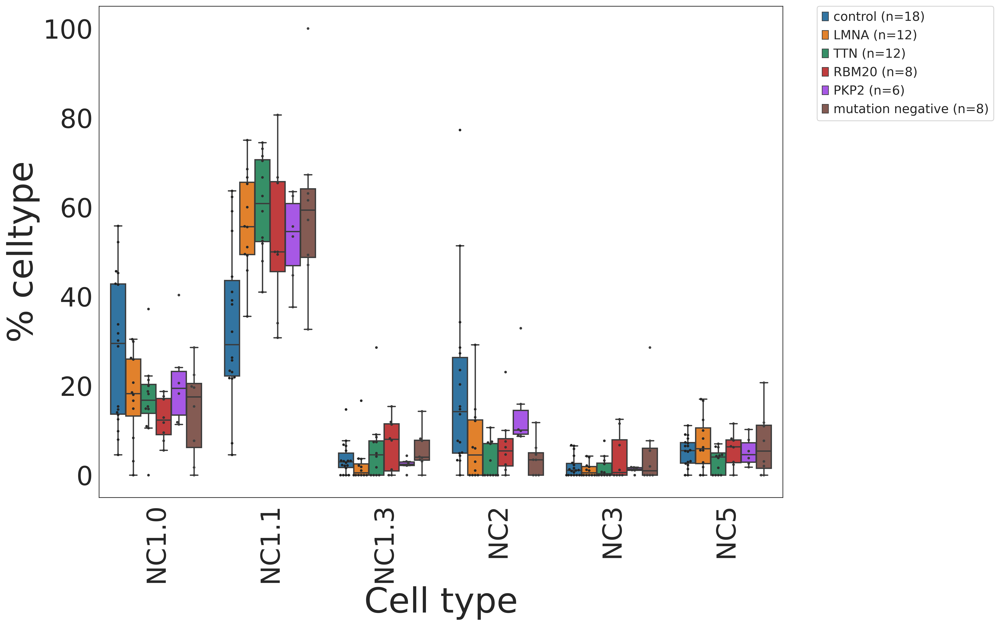

In [43]:
plot_celltype_abundance(NEURONAL_RAW_NODOUBLETS_harmony.obs, 'LVS', variable='cell_states', 
                            normalised_by=None, 
                            Genes_column='Clinical.dominant.mutation',
                            Genes_to_plot=[ 'control', 'LMNA', 'TTN', 'RBM20', 'PKP2', 'mutation negative'], 
                            celltypes_to_plot=['NC1.0', 'NC1.1', 'NC1.3', 'NC2', 'NC3', 'NC5'], 
                            plottype="boxplot", 
                            show_points=True, return_table=False, save_png=None, ylimit=None)

In [44]:
NEURONAL_RAW_NODOUBLETS_harmony.write("/fast/AG_Huebner/huebner3/ANALYSES/20190926_gp_BadOyenhausen/scanpy/20210302/Objects_cellxgene/Cellxgene_FTP/NC_DCM_annotated_NODOUBLETS_20211020_EL.h5ad")
NEURONAL_RAW_NODOUBLETS_harmony.obs.to_csv("/fast/AG_Huebner/huebner3/ANALYSES/20190926_gp_BadOyenhausen/scanpy/20210302/Objects_cellxgene/Cellxgene_FTP/NC_DCM_annotated_NODOUBLETS_20211020_EL_OBS.csv")

# Sanity check (Main 5B in paper)

In [8]:
NEURONAL_RAW_NODOUBLETS_harmony=sc.read_h5ad("/fast/AG_Huebner/huebner3/ANALYSES/20190926_gp_BadOyenhausen/scanpy/20210302/Objects_cellxgene/Cellxgene_FTP/NC_DCM_annotated_NODOUBLETS_20211020_EL.h5ad")

In [14]:
NEURONAL_RAW_NODOUBLETS_harmony

AnnData object with n_obs × n_vars = 7999 × 3911
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'Patient', 'Sample', 'Gender', 'Gene', 'Diagnosis', 'Clinical.dominant.mutation', 'Age', 'Mutation.Type', 'Genomic.location', 'Region', 'Origin', 'n_genes', 'percent_mito', 'percent_ribo', 'X10X_version', 'n_counts', 'solo_score', 'predicted_doublets_solo', 'scrublet_score_z', 'predicted_doublets_z', 'scrublet_score_log', 'predicted_doublets_log', 'Replicate', 'cell_states_20200602', 'cell_type_20200602', 'cell_type_20200921', 'cell_type_global_HCA', 'cell_states_HCA', 'cell_type_fine_20200921', 'cell_states_20200921', 'cell_states_long_20200921', 'cell_states_20210218', 'validated_20210218', 'leiden_01', 'leiden_02', 'leiden_03', 'leiden_04', 'cell_type', 'RNA_snn_res.0.1', 'seurat_clusters', 'RNA_snn_res.0.4', 'RNA_snn_res.0.6', 'RNA_snn_res.0.8', 'leidenNC', 'leidenNC8', 'NC_DCM_annotated_10062021', 'leiden', 'cell_states'
    var: 'gene_ids', 'feature_types', 'genome', 'highly_vari

In [17]:
sc.tl.rank_genes_groups(NEURONAL_RAW_NODOUBLETS_harmony, 'cell_states', method='wilcoxon')
expression=filter_by_expression(NEURONAL_RAW_NODOUBLETS_harmony, 'cell_states', key='rank_genes_groups')
expression.head(n=5)

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:17)


,NC1.0_na,NC1.0_pv,NC1.0_lo,NC1.0_pi,NC1.0_po,NC1.0_ei,NC1.0_eo,NC1.1_na,NC1.1_pv,NC1.1_lo,...,NC4_po,NC4_ei,NC4_eo,NC5_na,NC5_pv,NC5_lo,NC5_pi,NC5_po,NC5_ei,NC5_eo
0,MALAT1,1.927736e-63,0.277773,1.000000,1.000000,6.717871,6.525597,ZNF536,2.881594e-74,0.982818,...,0.375590,4.331073,0.936005,PPP2R2B,1.308062e-41,2.619969,0.605634,0.218936,1.803721,0.601635
1,RYR2,5.671696e-33,1.172001,0.478742,0.372174,1.494613,0.929999,NTM,2.557996e-73,1.168890,...,0.383242,4.669537,0.978284,NR2F2-AS1,6.780652e-27,2.016926,0.546948,0.246798,1.421799,0.574911
2,TTN,1.870383e-24,1.003178,0.453116,0.369946,1.370755,0.902568,NRXN1,6.595714e-72,0.605367,...,0.090550,2.782170,0.203799,DMD,3.993658e-24,1.280947,0.758216,0.566618,2.212140,1.469682
3,MYL2,6.400748e-10,0.435038,0.504950,0.502388,1.443606,1.221874,XKR4,3.482035e-69,1.044592,...,0.096289,2.617057,0.218572,ITGB8,7.857716e-24,1.499039,0.687793,0.491351,2.131642,1.288731
4,FHL2,1.641258e-06,0.995039,0.228888,0.158707,0.635037,0.368160,NEGR1,1.073162e-61,0.867969,...,0.121286,2.941600,0.278835,THSD7A,3.764999e-23,3.501493,0.356808,0.051367,0.855417,0.112801


In [69]:
(expression[(expression['NC1.0_pv']<0.05) & 
           (expression['NC1.0_lo']>0.7) &
           (expression['NC1.0_ei']>0.4)
          ].sort_values(by=["NC1.0_po"]).head(n=20))[['NC1.0_na', 'NC1.0_lo', 'NC1.0_pv', 
                                                      'NC1.0_pi', 'NC1.0_po']]

,NC1.0_na,NC1.0_lo,NC1.0_pv,NC1.0_pi,NC1.0_po
7,MLIP,0.971419,1.659246e-03,0.158998,0.101878
8,MYBPC3,0.808987,6.302566e-03,0.174723,0.126870
6,FGF12,0.989705,1.347851e-05,0.210250,0.141993
4,FHL2,0.995039,1.641258e-06,0.228888,0.158707
5,SLC8A1,0.906366,4.878736e-06,0.248690,0.188953
2,TTN,1.003178,1.870383e-24,0.453116,0.369946
1,RYR2,1.172001,5.671696e-33,0.478742,0.372174


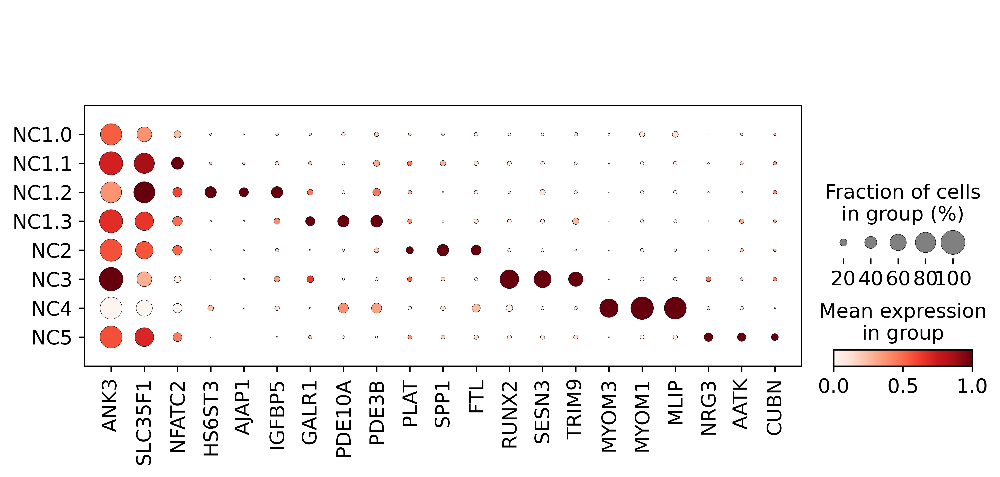

In [73]:
sc.pl.dotplot(NEURONAL_RAW_NODOUBLETS_harmony,
              ['ANK3', 'SLC35F1', 'NFATC2',
               'HS6ST3', 'AJAP1', 'IGFBP5',
               'GALR1', 'PDE10A', 'PDE3B',
               'PLAT', 'SPP1', 'FTL', 
               'RUNX2', 'SESN3', 'TRIM9',
              'MYOM3', 'MYOM1', 'MLIP',
              'NRG3', 'AATK', 'CUBN'
              
              ],
              groupby='cell_states', use_raw=True, standard_scale="var", save="MainFig5B_V2.pdf")